## Hackathon Day 1
### Data Loading and Exploration

In the first day of our Hackathon, we learn about loading and preprocessing the data and get some insights in the data structure and explemplary instances.

### Task 1: Select a dataset and initialize it

As the first step, we need to import the data and initialize the Dataset object. It handles the download and the access to single data instances. A second important step when using data for machine learning is to think about a proper preprocessing pipeline. Raw data often has value ranges or data structured that need to be changed before it can be used in machine learning models. A convenient package to define preprocessing transformations is `torchvision` (https://pytorch.org/vision/)

* Import the PneumoniaMNIST data with the `medmnist` package (https://medmnist.com/) and initialize it using preprocessing.
* The PneumoniaMNIST dataset comes with several image sizes. Find out which sizes are available and visualize the differences.

The MNIST datasets (as also many of other common data sets) have 3 so-called "splits".

* What are the 3 splits of the data set?
* What is the purpose of each split?

In [1]:
from torchvision.transforms import v2 as transforms
import torch
from medmnist import PneumoniaMNIST

# preprocessing
data_transform = transforms.Compose(
    [
        # the `Compose` function can take a list of transformations (also called pipeline)
        # think of necessary prepreocessing functions here and add them to the list
        transforms.ToImage(),
        transforms.ToDtype(torch.float32, scale=True),
        transforms.Normalize(mean=[0.5], std=[0.5]),
    ]
)

# simple initialization of training-, validation-, and test-set:
train_dataset = PneumoniaMNIST(split="train", transform=data_transform, download=True, size=(224))
validation_dataset = PneumoniaMNIST(split="val", transform=data_transform, download=True, size=(224))
test_dataset = PneumoniaMNIST(split="test", transform=data_transform, download=True, size=(224))

100%|██████████| 214M/214M [01:01<00:00, 3.49MB/s] 


### Task 2: Visualize the dataset

A visual exploration of the data should be one of your first steps when conducting a machine learning project. It helps to get familiar with the data structure and quality. Especially for use-case-tailored modeling task, it is essential to have a broad knowledge about the properties and characteristics of your data.

* Print out some properties of the datasets initialized before
* Visualize some example instances by using the `medmnist` package

Training Dataset:
Dataset PneumoniaMNIST of size 224 (pneumoniamnist_224)
    Number of datapoints: 4708
    Root location: /home/negar/.medmnist
    Split: train
    Task: binary-class
    Number of channels: 1
    Meaning of labels: {'0': 'normal', '1': 'pneumonia'}
    Number of samples: {'train': 4708, 'val': 524, 'test': 624}
    Description: The PneumoniaMNIST is based on a prior dataset of 5,856 pediatric chest X-Ray images. The task is binary-class classification of pneumonia against normal. We split the source training set with a ratio of 9:1 into training and validation set and use its source validation set as the test set. The source images are gray-scale, and their sizes are (384−2,916)×(127−2,713). We center-crop the images and resize them into 1×28×28.
    License: CC BY 4.0


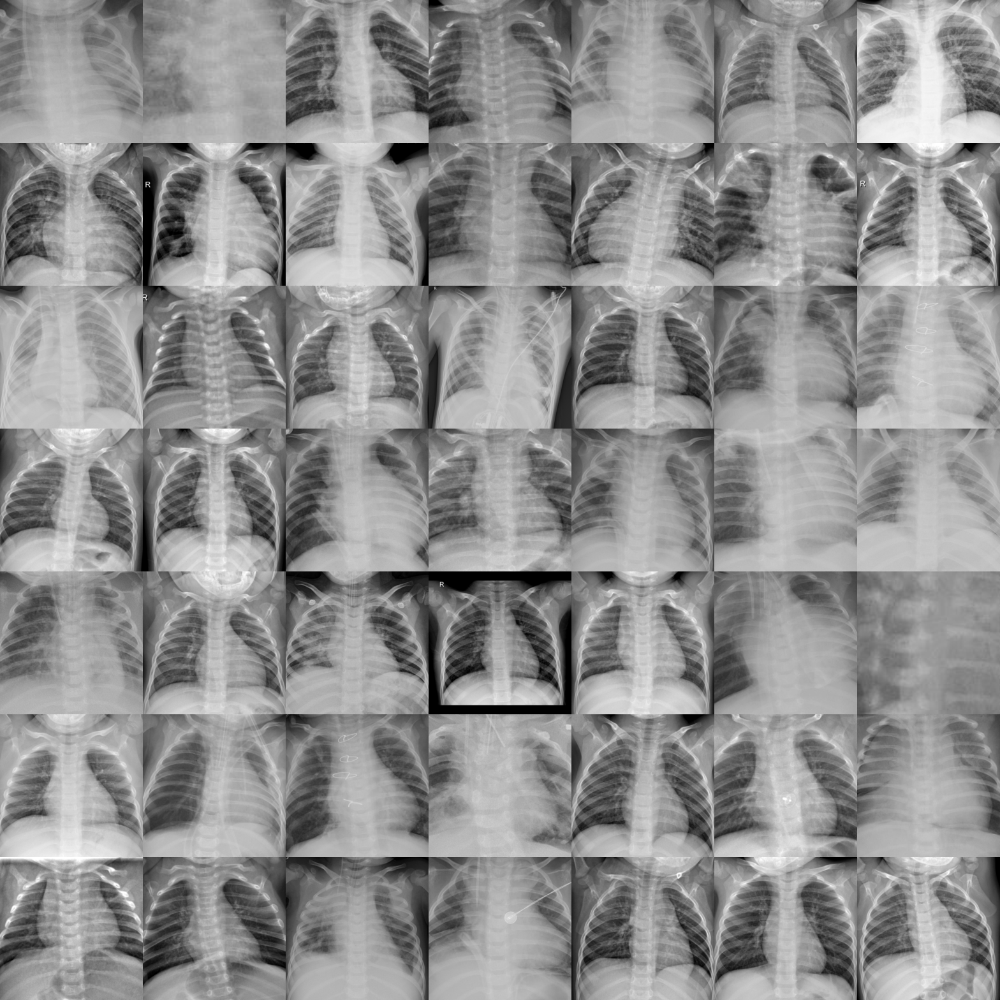

Validation Dataset:
Dataset PneumoniaMNIST of size 224 (pneumoniamnist_224)
    Number of datapoints: 524
    Root location: /home/negar/.medmnist
    Split: val
    Task: binary-class
    Number of channels: 1
    Meaning of labels: {'0': 'normal', '1': 'pneumonia'}
    Number of samples: {'train': 4708, 'val': 524, 'test': 624}
    Description: The PneumoniaMNIST is based on a prior dataset of 5,856 pediatric chest X-Ray images. The task is binary-class classification of pneumonia against normal. We split the source training set with a ratio of 9:1 into training and validation set and use its source validation set as the test set. The source images are gray-scale, and their sizes are (384−2,916)×(127−2,713). We center-crop the images and resize them into 1×28×28.
    License: CC BY 4.0


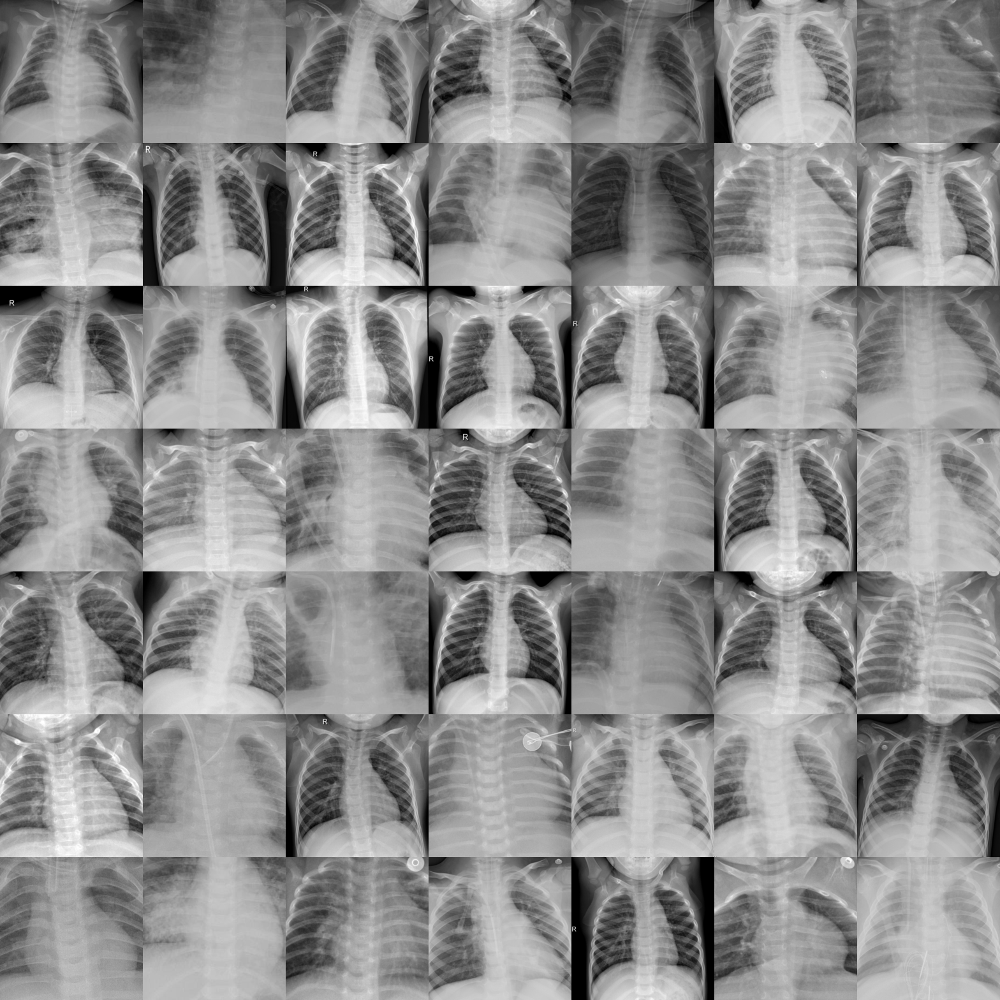

Test Dataset:
Dataset PneumoniaMNIST of size 224 (pneumoniamnist_224)
    Number of datapoints: 624
    Root location: /home/negar/.medmnist
    Split: test
    Task: binary-class
    Number of channels: 1
    Meaning of labels: {'0': 'normal', '1': 'pneumonia'}
    Number of samples: {'train': 4708, 'val': 524, 'test': 624}
    Description: The PneumoniaMNIST is based on a prior dataset of 5,856 pediatric chest X-Ray images. The task is binary-class classification of pneumonia against normal. We split the source training set with a ratio of 9:1 into training and validation set and use its source validation set as the test set. The source images are gray-scale, and their sizes are (384−2,916)×(127−2,713). We center-crop the images and resize them into 1×28×28.
    License: CC BY 4.0


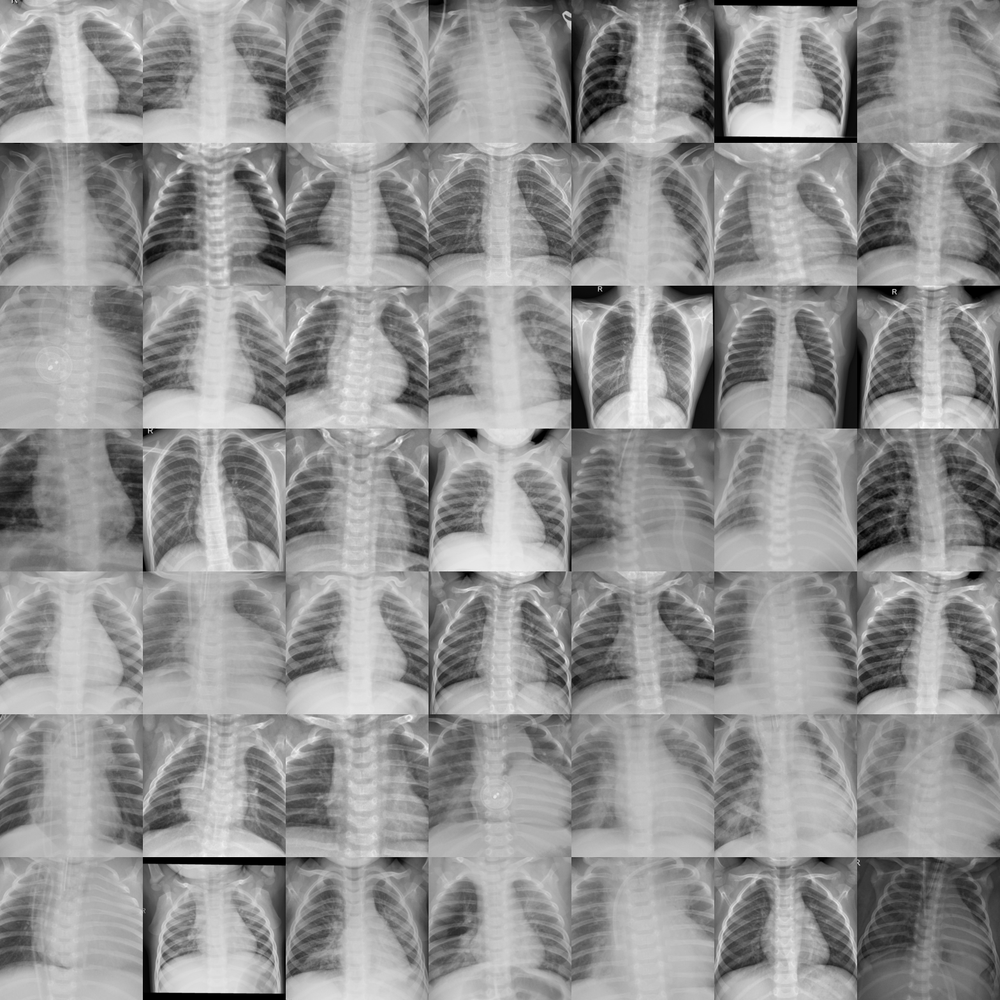

In [2]:
# Visualize properties and qualitative samples of training-set:
print("Training Dataset:")
print(train_dataset)
display(train_dataset.montage(length=7))
print("=======================================================")
# Visualize properties and qualitative samples of validation-set:
print("Validation Dataset:")
print(validation_dataset)
display(validation_dataset.montage(length=7))
print("=======================================================")
# Visualize properties and qualitative samples of test-set:
print("Test Dataset:")
print(test_dataset)
display(test_dataset.montage(length=7))
print("=======================================================")

As the dataset information shows, we have a binary classification task. The label '0' represents a normal chest X-Ray, whereas a label '1' represents a chest X-Ray where pneumonia is visible. Thus, it might be useful to see, if we already see differences in instances that have different labels.

* Write the code that visualizes 10 examples images from the train dataset for 'normal' and 'pneumonia' labels each using the `matplotlib` package (https://matplotlib.org/)

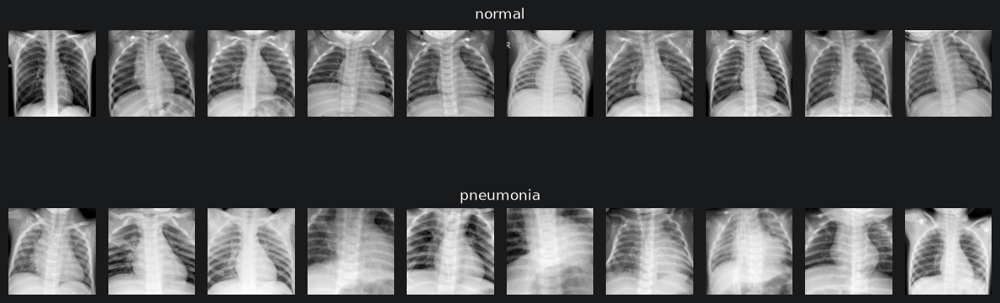

In [3]:
import matplotlib.pyplot as plt
%matplotlib inline

fig, axes = plt.subplots(2,10, figsize=(12, 6))
for n in range(2):
    count=0
    for img, label in train_dataset:
        if label[0]==n and count<10:
            axes[n,count].imshow(img[0],cmap="binary_r")
            axes[n,count].axis("off")
            count+=1

# Set titles for the rows
fig.text(0.5, 0.76, "normal", ha='center', fontsize=12)
fig.text(0.5, 0.4, "pneumonia", ha='center', fontsize=12)

# Adjust layout to ensure titles don't overlap with images
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

* Can you see significant differences between both labels? Briefly explain your findigs 

### Task 3: Plot class distributions

Another recommendable staight-forward exploration method is to have a look into the class label distributions, so how many instances are available for each label.

* Find a way to extract the labels for each of the 3 data sets (train, validation, test)
* Count the labels for each set

Hint: Use the `numpy` package

In [4]:
import numpy as np


# Helper function to extract the labels of the dataset
def get_labels(dataset):
    labels = []
    for _, label in dataset:
        labels.extend(label)
    return np.array(labels)


# Extract labels for each split
train_labels = get_labels(train_dataset)
validation_labels = get_labels(validation_dataset)
test_labels = get_labels(test_dataset)

# Calculate class counts for each split
train_counts = np.bincount(train_labels, minlength=2)
val_counts = np.bincount(validation_labels, minlength=2)
test_counts = np.bincount(test_labels, minlength=2)

Now, that we have the label counts, we want to visualize them for example as a bar plot. Again, use `matplotlib` for that.

* "easy" task: Make a separate class distribution bar plot for each set
* "advanced" task: Make a stacked bar plot for all class distributions

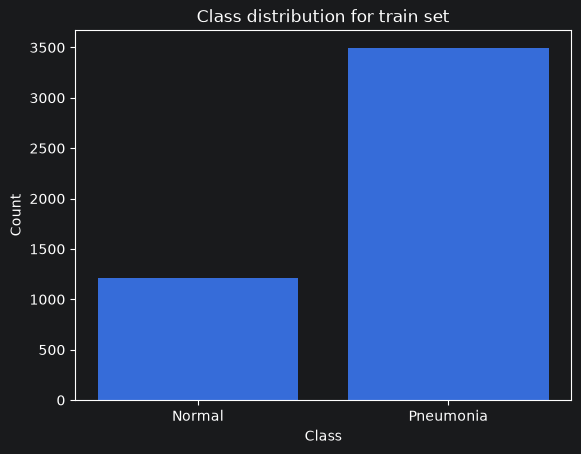

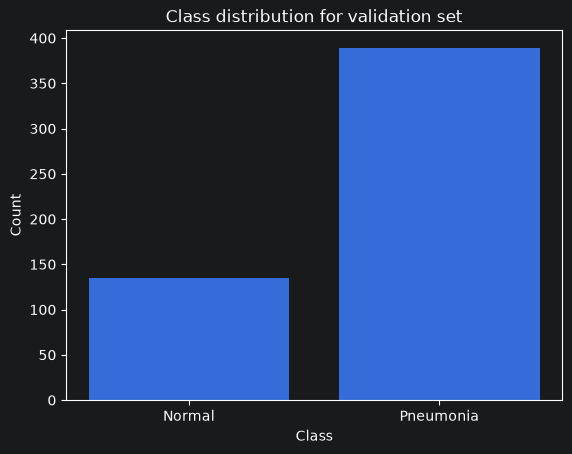

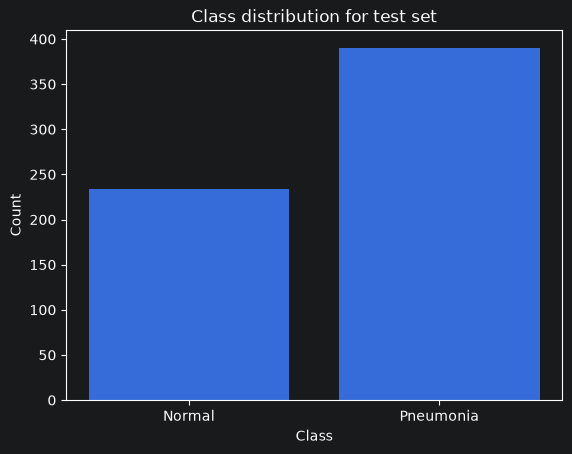

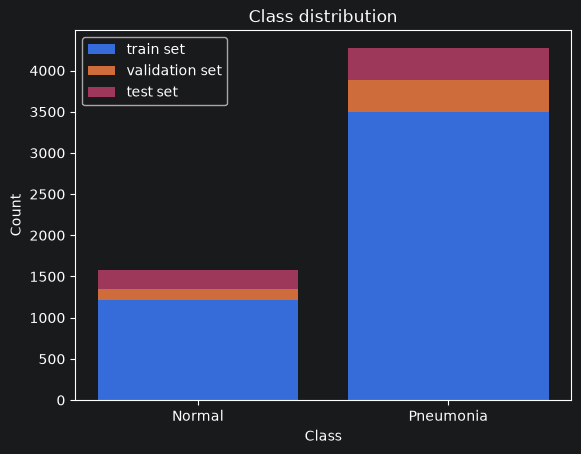

In [5]:
# Labels for plotting
labels_names = ["Normal", "Pneumonia"]

# Easy: Create single bar plots
for counts, split in zip([train_counts, val_counts, test_counts], ["train", "validation", "test"]):
    fig, ax = plt.subplots()
    ax.bar(labels_names, counts)
    ax.set_xlabel("Class")
    ax.set_ylabel("Count")
    ax.set_title(f"Class distribution for {split} set")
    plt.show()

# Advanced: Create a stacked bar plot
fig, ax = plt.subplots()
ax.bar(labels_names, train_counts, label="train set")
ax.bar(labels_names, val_counts, bottom=train_counts, label="validation set")
ax.bar(labels_names, test_counts, bottom=train_counts + val_counts, label="test set")

ax.set_xlabel("Class")
ax.set_ylabel("Count")
ax.set_title("Class distribution")
ax.legend()

plt.show()

Discribe your findings

* Can you see something remarkable?
* How are the labels distributed?
* Are there implications / difficulties that may occur during model training?

### Task 4 (optional): Data augmentation

####  Torchvision Augmentation

For the very most machine learning problems it is: the more data, the better. The higher the variety of the data, the more knowledge the model can gain from it which increases its accuracy. Of course, the total amount of data is limited and especially in medical imaging, data acquisition is fairly expensive. However, there are methods to increase the dataset size by artificial instances that are "close" or "similar" to the real data instances by manipulation of the existing real data. This principle is known as *Data Augmentation*.

In the field of (medical) image processing, we can augment our data e.g. by rotating, mirroring, or cropping existing images. Also changes in brightness, contrast, resolution, or adding random noise are possible. Basically, any augmentation method that leads to realistic representation and transformations of the real data is helpful.

In general torchvision transforms (https://pytorch.org/vision/stable/transforms.html) provide a module for data transformations and augmentation. The torchvision transforms can be composed in a seuential transform and applied on the fly when passed to the dataset object


In [6]:
train_transforms = transforms.Compose(
    [
        transforms.ToImage(),  # Convert to tensor, only needed if you have a PIL image
        transforms.RandomAutocontrast(),
        transforms.GaussianBlur(kernel_size=3),
        transforms.ToDtype(torch.float32, scale=True),
        transforms.Normalize(mean=[0.5], std=[0.5]),
    ]
)  # Normalize expects float input


train_dataset = PneumoniaMNIST(split="train", transform=train_transforms, download=True)

100%|██████████| 4.17M/4.17M [00:01<00:00, 3.00MB/s]


check if the images are transformed in the dataset on the fly.

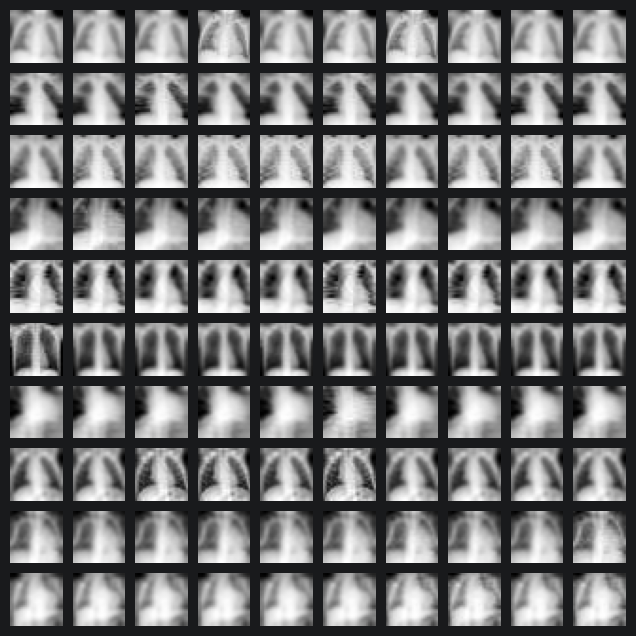

In [7]:
from mpl_toolkits.axes_grid1 import ImageGrid

fig = plt.figure(figsize=(8, 8))
grid = ImageGrid(fig, 111, nrows_ncols=(10, 10), axes_pad=0.1)

sample_images = [train_dataset[row_idx][0] for row_idx in range(10) for col_idx in range(10)]
for ax, im in zip(grid, sample_images):
    ax.imshow(im[0], cmap="gray")
    ax.axis("off")

plt.show()

#### MONAI augmentation

Especially for medial imaging, `MONAI` (https://monai.io/) is a powerful Python framework for machine learning in medical applications and, in particular, also provides image augmentation methods. Refer here https://docs.monai.io/en/stable/transforms.html.

In [8]:
# import monai libraries

import random
from monai.data import DataLoader, CacheDataset
from monai.utils import GridSamplePadMode
from monai.transforms import Compose, EnsureTyped, ScaleIntensityd, RandFlipd, RandAffined, RandGaussianNoised

In [9]:
data_transforms = Compose([EnsureTyped(keys=["image"], data_type="tensor"), ScaleIntensityd(keys=["image"], minv=0, maxv=1)])

# You can also randomly rotate or flip your dataset, apply gaussian noise, etc. to create more variability in the dataset

train_transforms = Compose(
    [
        EnsureTyped(keys=["image"], data_type="tensor"),
        RandFlipd(keys=["image"], prob=0.25, spatial_axis=1),
        RandAffined(
            keys=["image"],
            mode=("bilinear"),
            prob=0.5,
            shear_range=0.1,
            spatial_size=[224, 224],
            rotate_range=np.pi / 180 * 20,
            scale_range=0.1,
            padding_mode=GridSamplePadMode.BORDER,
        ),
        RandGaussianNoised(
            keys=["image"],
            prob=0.25,
            std=0.1,
        ),
        ScaleIntensityd(keys=["image"], minv=0, maxv=1),
    ]
)


# If you want to use Monai data transformations you have to use a wrapper class on PneumoniaMNIST to return the images and respective labels in the MONAI compatible format
class WrappedPneumoniaMNIST(PneumoniaMNIST):
    def __getitem__(self, index):
        image, label = super().__getitem__(index)
        image = torch.tensor(np.array(image)).unsqueeze(0)
        return {"image": image, "label": label}


# Load Pneumonia datase for training, validation and test
size = 224
train_dataset = WrappedPneumoniaMNIST(split="train", download=True, size=size)
val_dataset = WrappedPneumoniaMNIST(split="val", download=True, size=size)
test_dataset = WrappedPneumoniaMNIST(split="test", download=True, size=size)

# Wrap with MONAI CacheDataset
# Attention: If you use data augmentation, only apply it to training data and not to the validation and test set as we want to keep them unchanged.
train_monai_dataset = CacheDataset(data=train_dataset, transform=train_transforms, cache_rate=1.0, num_workers=4)
val_monai_dataset = CacheDataset(data=val_dataset, transform=data_transforms, cache_rate=1.0, num_workers=4)
test_monai_dataset = CacheDataset(data=test_dataset, transform=data_transforms, cache_rate=1.0, num_workers=4)

Loading dataset: 100%|██████████| 624/624 [00:00<00:00, 3024.40it/s]


We can visualize data augmentation by selecting random samples from the dataset

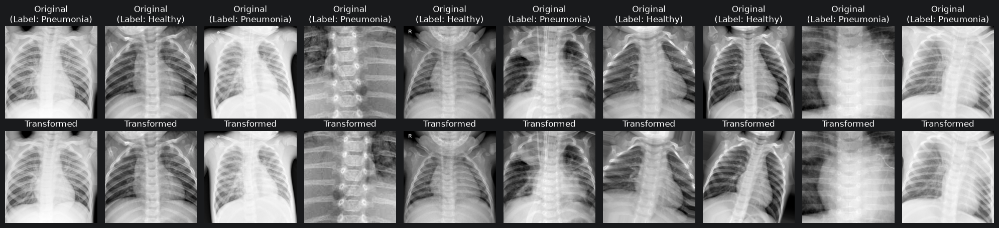

In [10]:
# Show 10 images
num_samples = 10

# Create a list with random indices
random_indices = random.sample(range(len(train_monai_dataset)), num_samples)

fig, axs = plt.subplots(2, num_samples, figsize=(20, 5))

for i, idx in enumerate(random_indices):
    orig_img = train_monai_dataset.data.imgs[idx]
    transformed_img = train_monai_dataset[idx]["image"]
    label = train_monai_dataset[idx]["label"]
    if label == 0:
        label_str = "Healthy"
    else:
        label_str = "Pneumonia"

    # Show image
    axs[0, i].imshow(orig_img, cmap="gray")
    axs[0, i].axis("off")
    axs[0, i].set_title(f"Original\n(Label: {label_str})")

    axs[1, i].imshow(transformed_img.squeeze(), cmap="gray")
    axs[1, i].axis("off")
    axs[1, i].set_title(f"Transformed")

plt.tight_layout(rect=[0, 0, 1, 0.95])  # for nice plots
plt.show()

### Task 5: Dataloader 

Training on large datasets all at once may exceed memory limits. Batching allows models to handle smaller chunks of data, fitting them into memory more easily. A DataLoader efficiently loads and manages data by handling batching, shuffling, and parallel processing. It feeds data into models during training and evaluation. Usually, we provide a dataset and batch size to the dataloader to create mini-batches out of the whole dataset.

In [11]:
from torch.utils.data import DataLoader

train_dataloader = DataLoader(dataset=train_dataset, batch_size=16, shuffle=True)

val_dataloader = DataLoader(dataset=validation_dataset, batch_size=16, shuffle=False)

test_dataloader = DataLoader(dataset=test_dataset, batch_size=16, shuffle=False)

### Task 6 (optional): ChestMNIST

Now, we have a look at another `medmnist` dataset - ChestMNIST.

* Initialize the ChestMNIST data sets with a preprocessing

In [12]:
from medmnist import ChestMNIST

# preprocessing
data_transform = transforms.Compose(
    [
        # the `Compose` function can take a list of transformations (also called pipeline)
        # think of necessary prepreocessing functions here and add them to the list
        transforms.ToImage(),
        transforms.ToDtype(torch.float32, scale=True),
        transforms.Normalize(mean=[0.5], std=[0.5]),
    ]
)

# simple initialization of training-, validation-, and test-set:
train_dataset = ChestMNIST(split="train", transform=data_transform, download=True, size=(224))
validation_dataset = ChestMNIST(split="val", transform=data_transform, download=True, size=(224))
test_dataset = ChestMNIST(split="test", transform=data_transform, download=True, size=(224))

100%|██████████| 3.89G/3.89G [12:22<00:00, 5.24MB/s]


Print out some data set properties and example images:

Training Dataset:
Dataset ChestMNIST of size 224 (chestmnist_224)
    Number of datapoints: 78468
    Root location: /home/negar/.medmnist
    Split: train
    Task: multi-label, binary-class
    Number of channels: 1
    Meaning of labels: {'0': 'atelectasis', '1': 'cardiomegaly', '2': 'effusion', '3': 'infiltration', '4': 'mass', '5': 'nodule', '6': 'pneumonia', '7': 'pneumothorax', '8': 'consolidation', '9': 'edema', '10': 'emphysema', '11': 'fibrosis', '12': 'pleural', '13': 'hernia'}
    Number of samples: {'train': 78468, 'val': 11219, 'test': 22433}
    Description: The ChestMNIST is based on the NIH-ChestXray14 dataset, a dataset comprising 112,120 frontal-view X-Ray images of 30,805 unique patients with the text-mined 14 disease labels, which could be formulized as a multi-label binary-class classification task. We use the official data split, and resize the source images of 1×1024×1024 into 1×28×28.
    License: CC BY 4.0


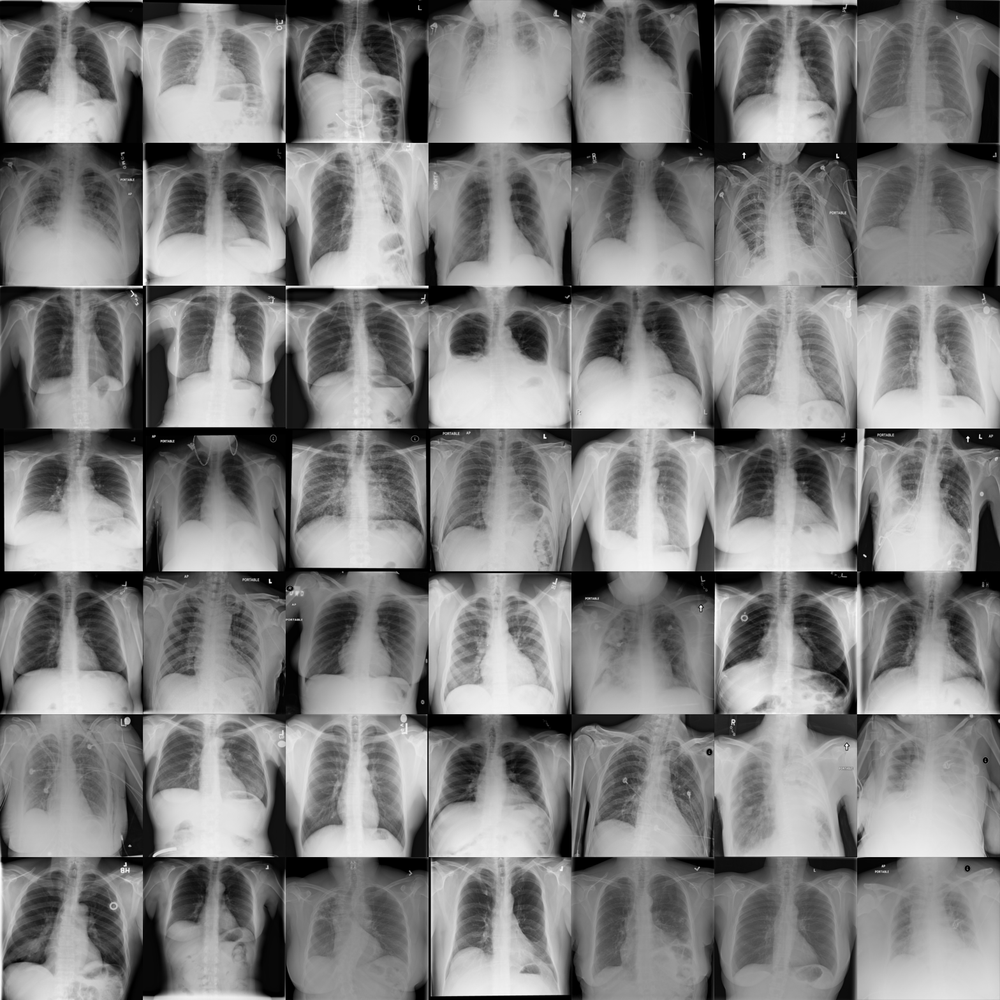

Validation Dataset:
Dataset ChestMNIST of size 224 (chestmnist_224)
    Number of datapoints: 11219
    Root location: /home/negar/.medmnist
    Split: val
    Task: multi-label, binary-class
    Number of channels: 1
    Meaning of labels: {'0': 'atelectasis', '1': 'cardiomegaly', '2': 'effusion', '3': 'infiltration', '4': 'mass', '5': 'nodule', '6': 'pneumonia', '7': 'pneumothorax', '8': 'consolidation', '9': 'edema', '10': 'emphysema', '11': 'fibrosis', '12': 'pleural', '13': 'hernia'}
    Number of samples: {'train': 78468, 'val': 11219, 'test': 22433}
    Description: The ChestMNIST is based on the NIH-ChestXray14 dataset, a dataset comprising 112,120 frontal-view X-Ray images of 30,805 unique patients with the text-mined 14 disease labels, which could be formulized as a multi-label binary-class classification task. We use the official data split, and resize the source images of 1×1024×1024 into 1×28×28.
    License: CC BY 4.0


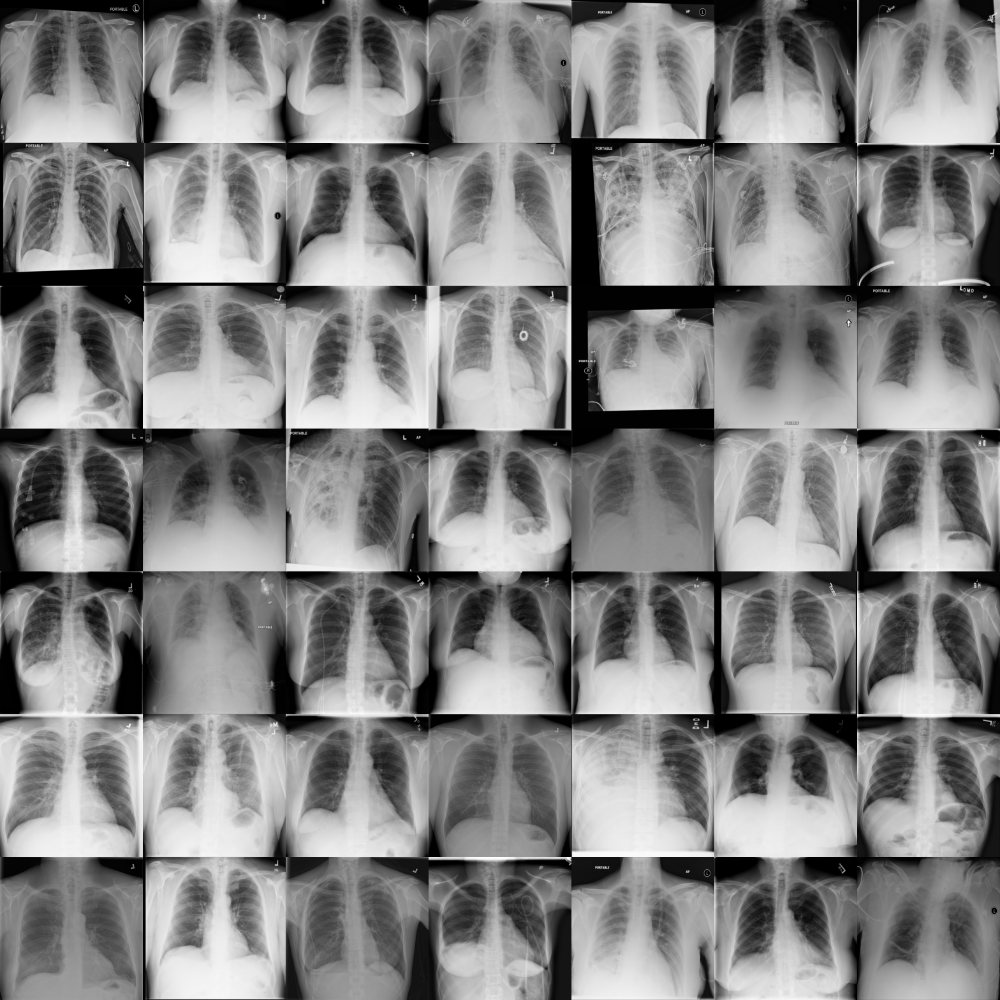

Test Dataset:
Dataset ChestMNIST of size 224 (chestmnist_224)
    Number of datapoints: 22433
    Root location: /home/negar/.medmnist
    Split: test
    Task: multi-label, binary-class
    Number of channels: 1
    Meaning of labels: {'0': 'atelectasis', '1': 'cardiomegaly', '2': 'effusion', '3': 'infiltration', '4': 'mass', '5': 'nodule', '6': 'pneumonia', '7': 'pneumothorax', '8': 'consolidation', '9': 'edema', '10': 'emphysema', '11': 'fibrosis', '12': 'pleural', '13': 'hernia'}
    Number of samples: {'train': 78468, 'val': 11219, 'test': 22433}
    Description: The ChestMNIST is based on the NIH-ChestXray14 dataset, a dataset comprising 112,120 frontal-view X-Ray images of 30,805 unique patients with the text-mined 14 disease labels, which could be formulized as a multi-label binary-class classification task. We use the official data split, and resize the source images of 1×1024×1024 into 1×28×28.
    License: CC BY 4.0


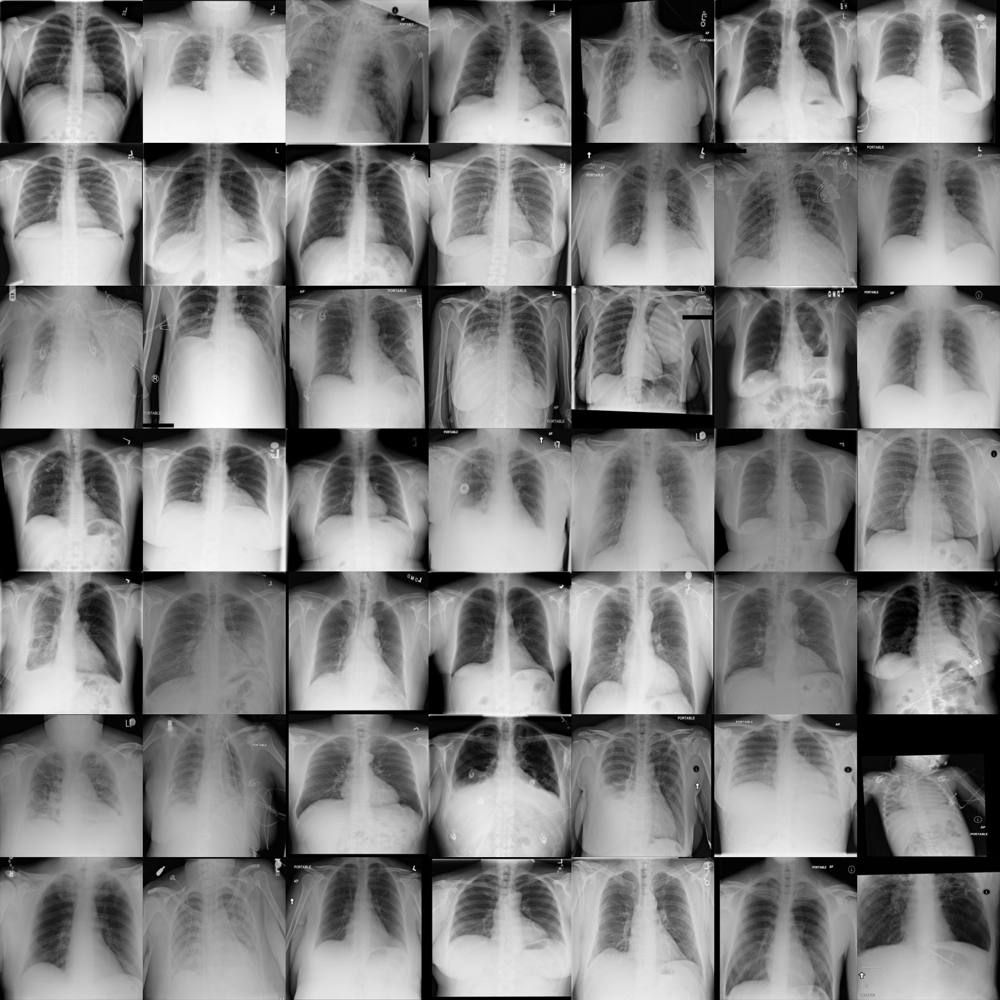

In [13]:
# Visualize properties and qualitative samples of training-set:
print("Training Dataset:")
print(train_dataset)
display(train_dataset.montage(length=7))
print("=======================================================")
# Visualize properties and qualitative samples of validation-set:
print("Validation Dataset:")
print(validation_dataset)
display(validation_dataset.montage(length=7))
print("=======================================================")
# Visualize properties and qualitative samples of test-set:
print("Test Dataset:")
print(test_dataset)
display(test_dataset.montage(length=7))
print("=======================================================")

What difference can you observe in the ChestMNIST dataset?

The ChestMNIST dataset is a so-called "multi-label" dataset.

* What is the difference between a "multi-label" and a "multi-class" problem?

Now, we have a look into how the labels are represented in the dataset.

* Print out the labels of a few instances and find out, how the labels are represented

The labels are represented in a so-calles "multi-hot" encoding. This is a binary label vector where a "0" means absence and "1" means presence of the respective disaese.

* Why is that convenient if you think about model training?

Again, we can count the label abundances but with another strategy than before.

* Try to find a efficient way to calculate the counts of each label by avoiding explicit loops
* Plot the results again in a stacked bar diagram
* What can you observe?

In [14]:
import numpy as np

# Calculate class counts for each split
train_counts = np.sum(train_dataset.labels, axis=0)
val_counts = np.sum(validation_dataset.labels, axis=0)
test_counts = np.sum(test_dataset.labels, axis=0)

labels_names = list(train_dataset.info["label"].values())

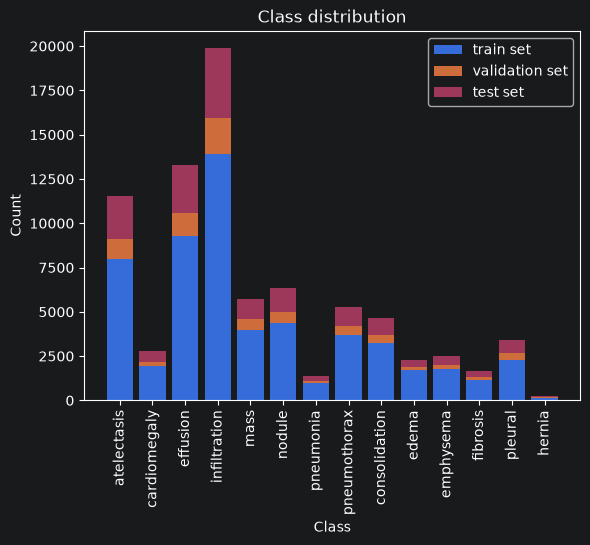

In [15]:
# Advanced: Create a stacked bar plot
fig, ax = plt.subplots()
ax.bar(labels_names, train_counts, label="train set")
ax.bar(labels_names, val_counts, bottom=train_counts, label="validation set")
ax.bar(labels_names, test_counts, bottom=train_counts + val_counts, label="test set")

ax.set_xlabel("Class")
ax.set_ylabel("Count")
ax.set_title("Class distribution")
ax.tick_params(axis="x", labelrotation=90)
ax.legend()

plt.show()

Since we have a multi-label problem here, it is hard to isolate one disease from another. However, we can do a more interesting thing! What about observing, if there are combinations of diseases that are more common than others or find correlations? A nice way of doing that is to calculate the correlation matrix. 

* Calculate the correlation matrix of the training labels.
* Plot the correlation matrix

In [16]:
corr_mat = np.corrcoef(train_dataset.labels, rowvar=False)

/tmp/ipykernel_776799/2876449843.py:10: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


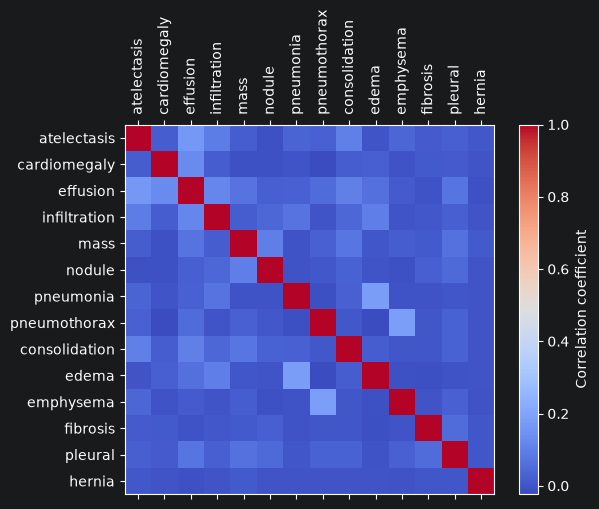

In [17]:
# plot the correlation matrix
fig, ax = plt.subplots()
cax = ax.matshow(corr_mat, cmap="coolwarm")
cbar = fig.colorbar(cax)
cbar.set_label("Correlation coefficient")
ax.set_xticks(np.arange(len(labels_names)))
ax.set_yticks(np.arange(len(labels_names)))
ax.set_xticklabels(labels_names, rotation=90)
ax.set_yticklabels(labels_names)
fig.show()

### if you are interested ...

There are some more interesting Python packages for data exploration and manipulation than `numpy` and `matplotlib`. Here, we briefly mention some recommendable packages.

#### [`pandas`](https://pandas.pydata.org)
Pandas is a comprehensive library for data analysis with python. It offers efficient data structures and data manipulation methods for mainly numerical structured or tabular data. Additionally, it includes some visualization functions.

#### [`seaborn`](https://seaborn.pydata.org)
Seaborn is a library for statistical data visualization. It is based on matplotlib and complements it regarding convenience functions for plotting and advanced design options enabling efficient data exploration.

#### [`scipy`](https://scipy.org)
  SciPy is one of the fundamental libraries for scientific computation with Python. It offers lots of algorithms and functions for optimization, integration, interpolation, linear algebra, differential equations, etc.
  
#### [`scikit image`](https://scikit-image.org)
  Scikit-image is a collection of algorithms for image processing and manipulation in Python. It offers functions in the context of image segmentation, geometric transforms, color manipulations, filtering, feature extraction and generation, etc.

# Hackathon Day 2
Today we want to train a Convolutional Neural Network for classifying pneumonia on the [PneumoniaMNIST](https://medmnist.com/) dataset


**Learning Outcome:** Learn how to
- define training and model parameters and analyse their influence on model performance
- write a training loop
- evaluate classification performance using different performance metrics 

# Task 1: Load dataset 
Use the code from day 1 to load your dataset.\
If you worked on this yesterday, you can also use data augmentation methods. Data augmentation is a technique used to increase the diversity of training data by applying random transformations, like rotating, flipping, or cropping images, to create new variations of existing data. This helps improve a model’s ability to generalize and perform better on unseen data.\
For data augmentation you can use the [MONAI library](https://docs.monai.io/en/stable/transforms.html)

In [18]:
# import some libraries we will need 

from medmnist import PneumoniaMNIST 
import numpy as np
import torch
import random
from matplotlib import pyplot as plt
import torch.nn as nn
from monai.data import DataLoader, CacheDataset
from monai.utils import  GridSamplePadMode
from monai.transforms import (
    Compose,
    RandAffined,
    RandFlipd,
    RandGaussianNoised,
    ScaleIntensityd,
    EnsureTyped,
)

In [19]:
data_transforms = Compose(
    [
        EnsureTyped(keys=['image'], data_type='tensor'),
        ScaleIntensityd(keys=['image'], minv=0, maxv=1 )
    ] )

# Optional: Apply Data Augmentation:
# You can also randomly rotate or flip your dataset, apply gaussian noise, etc. to create more variability in the dataset 
# see https://docs.monai.io/en/stable/transforms.html
train_transforms = Compose(
    [
        EnsureTyped(keys=['image'], data_type='tensor'),
        RandFlipd(
            keys = ['image'],
            prob = 0.25,
            spatial_axis=1),
        RandAffined(
            keys = ['image'],
            mode = ('bilinear'),
            prob = 0.5, 
            shear_range = 0.1,
            spatial_size = [224,224],
            rotate_range = np.pi/180*20,
            scale_range = 0.1,
            padding_mode = GridSamplePadMode.BORDER), 
        RandGaussianNoised(
            keys = ['image'],
            prob = 0.25, 
            std = 0.1,
            ),
        ScaleIntensityd(keys=['image'], minv=0, maxv=1 )
    ])
    

# If you want to use Monai data transformations you have to use this class
# to convert medmnist dataset to a format compatible with MONAI
class WrappedPneumoniaMNIST(PneumoniaMNIST):
    def __getitem__(self, index):
        #data = super().__getitem__(index)
        image, label = super().__getitem__(index)
        image = torch.tensor(np.array(image)).unsqueeze(0)
        return {"image": image, "label": label}

# Load Pneumonia datase for training, validation and test
size=224
train_dataset = WrappedPneumoniaMNIST(split="train",download=True, size=size)
val_dataset = WrappedPneumoniaMNIST(split="val",download=True, size=size)
test_dataset = WrappedPneumoniaMNIST(split="test",download=True, size=size)

# Wrap with MONAI CacheDataset
# Attention: If you use data augmentation, only apply it to training data and not to the validation and test set as we want to keep them unchanged.
train_monai_dataset = CacheDataset(data=train_dataset, transform=train_transforms, cache_rate=1.0, num_workers=4)
val_monai_dataset = CacheDataset(data=val_dataset, transform=data_transforms, cache_rate=1.0, num_workers=4)
test_monai_dataset = CacheDataset(data=test_dataset, transform=data_transforms, cache_rate=1.0, num_workers=4)

Loading dataset: 100%|██████████| 624/624 [00:00<00:00, 2955.48it/s]


In [20]:
# Next: initiliaze train_loader, val_loader and test_loader using DataLoader from MONAI
BATCH_SIZE = 64
train_loader = DataLoader(dataset=train_monai_dataset, batch_size=BATCH_SIZE, shuffle=True)
val_loader = DataLoader(dataset=val_monai_dataset, batch_size=BATCH_SIZE, shuffle=False)
test_loader = DataLoader(dataset=test_monai_dataset, batch_size=BATCH_SIZE, shuffle=False)

# Task 2: Define training and model parameters
- We want to train a classification model. You can for example use the **ResNet18** model. To initialize the model you can use [Monai](https://docs.monai.io/en/stable/networks.html#nets). 
- Moreover, we have to define our training parameters, as optimizer, loss function and learning rate. 
- For a binary classification problem you can for example use binary cross entropy loss (see [here](https://pytorch.org/docs/stable/generated/torch.nn.BCELoss.html)). 
- As optimizer you can use stochastic gradient descent (see [here](https://pytorch.org/docs/stable/generated/torch.optim.SGD.html)) 

Carry out several experiments and vary the model parameters. What effect does this have on the model performance?\
You can use, for example, a larger model (e.g. ResNet 50), and vary the learning rate and the batch size. Write down your observations.  
For quick experiments, you can work with the small data set (28x28). Ultimately, however, you should train a model on one of the higher-resolution data sets (64x64 or 224x224). 

**Solution:**
When training a Convolutional Neural Network (CNN), several parameters significantly influence the performance, efficiency, and final outcome of the model. Understanding how variations in these parameters affect training can help you fine-tune your model for better accuracy, faster convergence, and more effective generalization.

1. **Learning Rate**:\
    The learning rate is a critical hyperparameter that controls the size of the steps the model takes when updating its weights based on the gradient of the loss function.

- Too high learning rate:
    - The model takes large steps towards the minimum of the loss function.
    - This can lead to overshooting the optimal solution, causing the loss to oscillate or even diverge.    
    - Training might become unstable, and the model might fail to converge.
- Too low learning rate:
    - The model takes very small steps, leading to slow convergence.
    - Training can take much longer, and the model might get stuck in a local minimum, potentially not reaching the best possible solution.
    - The risk of overfitting increases since the model might focus too much on the training data details.
- Optimal learning rate:
    - Achieves a good balance, allowing the model to converge efficiently.  
    - Helps the model reach a good minimum in the loss landscape, resulting in better performance.

2. **Model Size**:\
    The size of the model is determined by the number of layers and the number of neurons / filters in each layer.\
    Advantages of using a larger model:
    - Can capture more complex patterns in the data due to a higher capacity (more parameters).
    - Often performs better on large, complex datasets.
    Disadvantages of using a larger model:
    - Requires more computational resources (memory and processing power).
    - Takes longer to train.
    - More prone to overfitting, especially if the dataset is small or not sufficiently diverse.

3. **Batch Size**:\
    The batch size is the number of training examples used to calculate the gradient during one iteration of the training process.

    Advantages of using a larger batch size:
    - Produces smoother and more stable gradient estimates, leading to faster convergence.
    
    Disadvantages of using a larger batch size:
    - Requires more memory, which can be a limitation on certain hardware.
    - More prone to getting stuck in local minima, leading to potential overfitting and reduced generalization ability.



In [21]:
from monai.networks.nets import resnet18, resnet50

device = torch.device(f'cuda' if torch.cuda.is_available() else 'cpu')

model = resnet50(spatial_dims=2, num_classes=1, n_input_channels=1).to(device) #resnet18(spatial_dims=2,num_classes=1,n_input_channels=1).to(device)
# You can also use num_classes = 2 and change the activation function to softmax instead of sigmoid.
# With one class and sigmoid activation function the output of the network is transformed to a probability x
# with x < 0.5 = no pneumonia and x >= 0.5 = pneumonia.
criterion = nn.BCEWithLogitsLoss()

NUM_EPOCHS = 500

lr=0.001 
wd=0.001 
# You can use weight decay as a penalty term for the model weights. 
# This penalty term prevents the weights from becoming to large and thus helps the model not only to memorize the training data, 
# but also to learn general patterns that can be applied to new data (prevents overfitting)

optimizer = torch.optim.SGD(model.parameters(), lr=lr, momentum=0.9, nesterov=True, weight_decay=wd) 

# Task 3: Evaluation function 
- Use [scikit-learn](https://scikit-learn.org/stable/modules/model_evaluation.html) to evaluate your model
- For a classification task you can for example use metrics like AUC, Accuracy, F1-Score, Sensitivity and Specificity

What exactly do the individual metrics mean? How can you interpret the results?

**Solution**:
1. Accuracy
    - Accuracy is the proportion of correctly predicted instances (both positives and negatives) out of the total number of instances.
    - A higher accuracy means that more predictions are correct.
    - However, accuracy can be misleading if the data is imbalanced (e.g., if there are many more negatives than positives).
2. AUC (Area Under the Curve)
    - Specifically, it refers to the Area Under the ROC (Receiver Operating Characteristic) Curve. The ROC curve plots the true positive rate (Sensitivity) against the false positive rate (1 - Specificity).
    - The AUC ranges from 0 to 1. A score closer to 1 indicates a better model that distinguishes between positive and negative classes effectively.
    - An AUC of 0.5 suggests the model is no better than random guessing.
3. Sensitivity (Recall)
    - The proportion of actual positives that the model correctly identifies (true positives out of all positives).
    - High Sensitivity means the model correctly identifies most of the positive cases.
    - It’s important in situations where missing a positive case is costly (e.g., diagnosing a disease).
4. Specificity
    - The proportion of actual negatives that the model correctly identifies (true negatives out of all negatives).
    - High Specificity means the model correctly identifies most of the negative cases.
    - It’s crucial in situations where false positives are problematic (e.g., false alarms in a security system).
5. F1-Score
    - The harmonic mean of Precision and Recall (Sensitivity).
    - Precision is the proportion of true positives out of all predicted positives.
    - The F1-Score balances Precision and Recall, making it useful when you want to consider both false positives and false negatives.
    - It's especially helpful when the classes are imbalanced.

In [22]:
from sklearn.metrics import (
    accuracy_score,
    f1_score,
    recall_score,
    roc_auc_score
    )

def evalModel(y_true, y_score, thresh=0.5):
    y_true = y_true.squeeze() # ground truth class / label
    y_score = y_score.squeeze() # probabilities 

    y_pred = (y_score > thresh).astype(int) # predicted class

    metric_dict = {}

    metric_dict['Acc'] = accuracy_score(y_true, y_pred)
    metric_dict['F1'] =  f1_score(y_true=y_true, y_pred=y_pred, zero_division = 0)
    metric_dict['Sensitivity'] = recall_score(y_true=y_true, y_pred=y_pred, zero_division = 0)
    metric_dict['Specificity'] = recall_score(y_true=y_true, y_pred=y_pred, zero_division = 0, pos_label=0)    
    metric_dict['AUC'] = roc_auc_score(y_true, y_score)

    return metric_dict

# Task 4: Training loop
A training loop is the repetitive process in which a model learns from data by iteratively passing batches through the network, calculating loss, updating weights using an optimizer, and repeating until the model converges or a set number of iterations is reached.

In [23]:
import os
import time
from tqdm import tqdm 

final_model_path = os.path.join(os.path.dirname(os.path.realpath('__file__')),f'finalModel_{NUM_EPOCHS}_Epochs_size_{size}.model')
best_model_path = os.path.join(os.path.dirname(os.path.realpath('__file__')),f'bestModel_{NUM_EPOCHS}_Epochs_size_{size}.model')

# to save performances 
writer_dict = {'epoch': [],
               'loss_train': [],
               'loss_valid': [],
               'lr': [],
               'Acc': [],
               'F1': [],
               'Sensitivity': [],
               'Specificity': [],
               'AUC': []}

train_loss = []
val_loss = []

min_valid_loss = None
scaler = torch.amp.GradScaler() 
# https://pytorch.org/tutorials/recipes/recipes/amp_recipe.html
# Gradient scaling helps prevent gradients with small magnitudes from flushing to zero (“underflowing”) when training with mixed precision.

for epoch in range(NUM_EPOCHS):

    start_time = time.time()
  
    model.train()
    for batch in tqdm(train_loader):
        optimizer.zero_grad()

        with torch.autocast(device_type='cuda'):
        
            inputs = batch['image'].to(device) # move to gpu
            targets = batch['label'].to(device,torch.float16)
        
            outputs = model(inputs)
                    
            loss = criterion(outputs, targets)

        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()

        train_loss.append(loss.item())
    
    lr = optimizer.param_groups[0]['lr']
    writer_dict['lr'].append(lr)
    
    if epoch == NUM_EPOCHS-1:
        # You can use this code to save your model
        state_dict = model.state_dict()
        for key in state_dict.keys():
            state_dict[key] = state_dict[key].cpu()

        torch.save({
            'epoch': epoch,
            'save_dir': final_model_path,
            'state_dict': state_dict,
            'optimizer_state_dict': optimizer.state_dict()},
            final_model_path)

    # Now we want to evaluate our model on the validation data
    model.eval()
    y_true = torch.tensor([]).to(device)
    y_score = torch.tensor([]).to(device)
    
    with torch.no_grad():
        for batch in val_loader:
            with torch.autocast(device_type='cuda'):

                inputs = batch['image'].to(device)
                targets = batch['label'].to(device, torch.float16)
                outputs = model(inputs)
            
            val_loss.append(criterion(outputs, targets).item())

            y_true = torch.cat((y_true, targets), 0)
            y_score = torch.cat((y_score, outputs.sigmoid()), 0) # sigmoid to transform outputs from logits to probabilites 
    
    y_true = y_true.cpu().numpy()
    y_score = y_score.detach().cpu().numpy()

    
    # Save best model on validation set 
    if epoch == 0:
        min_valid_loss = np.mean(val_loss)
        state_dict = model.state_dict()
        for key in state_dict.keys():
            state_dict[key] = state_dict[key].cpu()

        torch.save({
            'epoch': epoch,
            'save_dir': best_model_path,
            'state_dict': state_dict,
            'optimizer_state_dict': optimizer.state_dict()},
            best_model_path)
            
    elif np.mean(val_loss) < min_valid_loss:
        min_valid_loss = np.mean(val_loss)
        state_dict = model.state_dict()
        for key in state_dict.keys():
            state_dict[key] = state_dict[key].cpu()
    
        torch.save({
            'epoch': epoch,
            'save_dir': best_model_path,
            'state_dict': state_dict,
            'optimizer_state_dict': optimizer.state_dict()},
            best_model_path)
    
    # to monitor model performance  
    writer_dict['epoch'].append(epoch)
    writer_dict['loss_train'].append(np.mean(train_loss))
    writer_dict['loss_valid'].append(np.mean(val_loss))

    metric_dict_val = evalModel(y_true,y_score)

    for cur_key in metric_dict_val.keys():
        writer_dict[cur_key].append(metric_dict_val[cur_key])
    
    end_time = time.time()
 
    print('Epoch %03d, time for epoch: %3.2f' %(epoch, end_time-start_time))
    print('loss %2.4f, validation loss %2.4f, Val AUC: %3f, Val F1: %3f' %(np.mean(train_loss), np.mean(val_loss), metric_dict_val['AUC'], metric_dict_val['F1']))   

  0%|          | 0/74 [00:00<?, ?it/s][W902 15:31:22.268737215 CUDACachingAllocator.cpp:3933] memory allocation failed with OOM on device 0 while trying to allocate 54525952 bytes (free: 61603840, total: 11323179008).
[W902 15:31:22.268814480 CUDACachingAllocator.cpp:3933] memory allocation failed with OOM on device 0 while trying to allocate 54525952 bytes (free: 61603840, total: 11323179008).
[W902 15:31:22.301942761 CUDACachingAllocator.cpp:3933] memory allocation failed with OOM on device 0 while trying to allocate 54525952 bytes (free: 61603840, total: 11323179008).
[W902 15:31:22.302021979 CUDACachingAllocator.cpp:3933] memory allocation failed with OOM on device 0 while trying to allocate 54525952 bytes (free: 61603840, total: 11323179008).
[W902 15:31:22.302660486 CUDACachingAllocator.cpp:3933] memory allocation failed with OOM on device 0 while trying to allocate 54525952 bytes (free: 61603840, total: 11323179008).
[W902 15:31:22.302726450 CUDACachingAllocator.cpp:3933] memory

OutOfMemoryError: CUDA out of memory. Tried to allocate 26.00 MiB. GPU 0 has a total capacity of 10.55 GiB of which 58.75 MiB is free. Including non-PyTorch memory, this process has 9.08 GiB memory in use. Of the allocated memory 8.85 GiB is allocated by PyTorch, and 43.16 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://docs.pytorch.org/docs/stable/notes/cuda.html#optimizing-memory-usage-with-pytorch-cuda-alloc-conf)

## Task 5: Final model evaluation
- Plot the loss function and the determined evaluation metrics
- Write an evaluation / inference function to evaluate the trained model on the test set
- Check the false-positive and false negative cases

Take a closer look at the results of the model. Are there any reasons why the model was wrong here?

In [ ]:
# Plot training and validation loss saved in writer_dict
from matplotlib import pyplot as plt
plt.figure()
plt.plot(writer_dict['loss_train'],color='blue',label='Train loss')
plt.plot(writer_dict['loss_valid'],color='orange',label='Validation loss')
plt.legend()
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.show()

In [ ]:
# plot evaluation metrics saved in writer_dict
plt.figure()
plt.plot(writer_dict['Acc'],label='Acc')
plt.plot(writer_dict['F1'],label='F1')
plt.plot(writer_dict['Sensitivity'],label='Sensitivity')
plt.plot(writer_dict['Specificity'],label='Specificity')
plt.plot(writer_dict['AUC'],label='AUC')
plt.legend()
plt.xlabel('Epoch')
plt.ylabel('Performance')
plt.show()

In [ ]:
# save writer_dict 
# see: https://stackoverflow.com/questions/11218477/how-can-i-use-pickle-to-save-a-dict-or-any-other-python-object
import pickle

savePath = os.path.join(os.path.dirname(os.path.realpath('__file__')),f'writer_dict_{NUM_EPOCHS}_Epochs_size_{size}.pickle')

# write dictionary
with open(savePath, 'wb') as f:
    pickle.dump(writer_dict, f, protocol=pickle.HIGHEST_PROTOCOL)

# load dictionary
with open(savePath, 'rb') as f:
    loadedDict = pickle.load(f)


## Model inference
Now we want to use our trained model to predict new data.\
Therefore, we define a function *infer*, which gets a data loader and the trained model as input. \
You can use the code from the training loop for help.

In [ ]:
def infer(data_loader, model):
    model.eval()
    y_true = torch.tensor([]).to(device)
    y_score = torch.tensor([]).to(device)
    
    with torch.no_grad():
        for batch in data_loader:
            with torch.autocast(device_type='cuda'):

                inputs = batch['image'].to(device)
                targets = batch['label'].to(device, torch.float16)
                
                outputs = model(inputs)
                
                y_true = torch.cat((y_true, targets), 0)
                y_score = torch.cat((y_score, outputs.sigmoid()), 0)

        y_true = y_true.cpu().numpy()
        y_score = y_score.detach().cpu().numpy()

        metric_dict = evalModel(y_true, y_score)

        y_pred = (y_score >= 0.5).astype(int)

        print('auc: %.3f  acc:%.3f, f1: %3f, sens.: %3f, spec.: %3f' %(metric_dict['AUC'],metric_dict['Acc'], metric_dict['F1'],metric_dict['Sensitivity'], metric_dict['Specificity']))
        

    return metric_dict, y_pred

In [ ]:
# You can use the code belwo to load the best model
model = resnet50(spatial_dims=2,num_classes=1,n_input_channels=1).to(device)
checkpoint = torch.load(best_model_path)
model.load_state_dict(checkpoint['state_dict'])
model.eval()

print('==> Evaluating ...')
print('Validation performance:')
metrics_val, val_pred = infer(val_loader, model)
print('Test performance')
metrics_test, test_pred = infer(test_loader, model)

# Now we want to convert our dictionaries to a pandas dataframe and save the results as csv file
# see https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.from_dict.html
import pandas as pd
df_test = pd.DataFrame(metrics_test,index=[0])
df_test.to_csv(os.path.join(os.path.dirname(os.path.realpath('__file__')),f'testPerf_{NUM_EPOCHS}_Epochs_size_{size}.csv'))

df_val = pd.DataFrame(metrics_val,index=[0])
df_val.to_csv(os.path.join(os.path.dirname(os.path.realpath('__file__')),f'valPerf_{NUM_EPOCHS}_Epochs_size_{size}.csv'))


Now we want to have a closer look on our model performance and the predicted results from our test set. \
Write code, to visualize false positive (prediction = Pneumonia, label = Healthy) and false negative cases (prediction = Healthy, label = Pneumonia)

In [ ]:
# Check false positive and false negative test cases
# save indices for fp and fn in a separate list
fp_cases = []
fn_cases = []
for cur_ind in range(len(test_dataset)):
    if test_pred[cur_ind] == 1 and test_dataset.labels[cur_ind]==0:
        fp_cases.append(cur_ind)
    elif test_pred[cur_ind] == 0 and test_dataset.labels[cur_ind]==1:
        fn_cases.append(cur_ind)

# plot fp cases:
imagesInARow=min(10,len(fp_cases))
rows=int(np.ceil(len(fp_cases)/imagesInARow))


if imagesInARow==1:
    fig = plt.figure()
    plt.title('False positive cases')
    plt.imshow(orig_img, cmap='gray')
    plt.axis('off')
else:
    fig, axs = plt.subplots(rows, imagesInARow)
    fig.suptitle('False positive cases')
    row=0
    col=0

    for i, idx in enumerate(fp_cases):
        orig_img = train_dataset.imgs[idx]

        if col>=imagesInARow:
            row+=1
            col=0

        if rows > 1:
            axs[row,col].imshow(orig_img, cmap='gray')
            axs[row,col].axis('off')
        else:
            axs[col].imshow(orig_img, cmap='gray')
            axs[col].axis('off')
        col+=1

    plt.show()

# plot fn cases:
imagesInARow=min(10,len(fn_cases))
rows=int(np.ceil(len(fn_cases)/imagesInARow))

if imagesInARow==1:
    fig = plt.figure()
    plt.title('False negative cases')
    plt.imshow(orig_img, cmap='gray')
    plt.axis('off')
else:
    fig, axs = plt.subplots(rows, imagesInARow)
    fig.suptitle('False negative cases',y=0.8)
    row=0
    col=0

    for i, idx in enumerate(fn_cases):
        orig_img = train_dataset.imgs[idx]

        if col>=imagesInARow:
            row+=1
            col=0

        if rows > 1:
            axs[row,col].imshow(orig_img, cmap='gray')
            axs[row,col].axis('off')
        else:
            axs[col].imshow(orig_img, cmap='gray')
            axs[col].axis('off')
            
        col+=1

    plt.show()

# Optional Tasks
When you have finished everything else, you can continue working on one of the following tasks, for example, or come up with something of your own
## Task 1: Multi-label classification
So far we have only dealt with a binary classification problem. However, we often also have to deal with multi-label problems. Multi-label classification is a type of classification where each data point can belong to multiple classes simultaneously, meaning the model predicts a set of labels rather than just one. For example, a photo might be labeled as both "cat" and "dog" if it contains both animals.
You can use and adapt the code you have developed here to solve a multi-label classification problem using the ChestMNIST from the [MedMnist](https://medmnist.com/) data set.

## Task 2: Large Language Models
Use Large Language Models (LLMs) to generate radiological reports for the PneumoniaMNIST dataset. See for example  https://huggingface.co/microsoft/Phi-3-vision-128k-instruct

## Task 3: Generative data augmentation
For generative data augmentation you can for example train a conditional Generative Adversarial Network (GAN) to generate new healty and new pneumonia images, see for example: https://github.com/qbxlvnf11/conditional-GAN/blob/main/conditional-GAN-generating-fashion-mnist.ipynb 
GANs are relatively difficult to train, which is why you can also consider using a pre-trained GAN to achieve better results. You can take a look at this: GANs are relatively difficult to train, which is why you can also consider using a pre-trained GAN to achieve better results. You can take a look at this: https://github.com/Project-MONAI/tutorials/blob/main/modules/mednist_GAN_tutorial.ipynb.




In [ ]:
from medmnist import PneumoniaMNIST as MNISTdata # ChestMNIST / BreastMNIST / PathMNIST / DermaMNIST / OCTMNIST / PneumoniaMNIST / BloodMNIST
from torchvision import transforms
import matplotlib.pyplot as plt

from torch.utils.data import DataLoader
import torch

from monai.networks.nets import resnet18

from sklearn.metrics import accuracy_score, roc_auc_score, f1_score, precision_score, recall_score
from tqdm import tqdm
import numpy as np

## Dataloading

In [ ]:
# preprocessing
data_transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[.5], std=[.5])
])

size = 64
# simple initialization of training-, validation-, and test-set: 
train_dataset = MNISTdata(split='train', transform=data_transform, download=True, size=size)
validation_dataset = MNISTdata(split='val', transform=data_transform, download=True, size=size)
test_dataset = MNISTdata(split='test', transform=data_transform, download=True, size=size)



# Define Dataloader with batchsize
BATCH_SIZE=64
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
validation_loader = DataLoader(validation_dataset, batch_size=BATCH_SIZE, shuffle=True)


In [ ]:
test_loader = DataLoader(test_dataset, batch_size=1, shuffle=True)

## Model Setup

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)

final_model_path = '/path/to/your/final/classificaion_model.pth'
model = resnet18(spatial_dims=2,num_classes=1,n_input_channels=1).to(device)

checkpoint = torch.load(final_model_path)
model.load_state_dict(checkpoint['state_dict'])
model.eval()


## Interpretation

In [ ]:
import captum.attr as cap
from pytorch_grad_cam import GradCAM, ScoreCAM, GradCAMPlusPlus
## https://pythonrepo.com/repo/jacobgil-pytorch-grad-cam
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

In [ ]:
# an auxillary plot-function
def plot3(base_img,attr1,attr2,attr3,titles,cmaps, vmin=None, vmax=None):
    plt.figure(figsize=(12,5))
    plt.subplot(131)
    plt.imshow(base_img,cmap="binary_r")
    plt.imshow(attr1,alpha=0.5,cmap=cmaps[0], vmin=vmin, vmax=vmax)
    plt.colorbar(shrink=0.6,aspect=20*0.7)
    plt.axis("off")
    plt.title(titles[0])
    plt.subplot(132)
    plt.imshow(base_img,cmap="binary_r")
    plt.imshow(attr2,alpha=0.5,cmap=cmaps[1], vmin=vmin, vmax=vmax)
    plt.colorbar(shrink=0.6,aspect=20*0.7)
    plt.axis("off")
    plt.title(titles[1])
    plt.subplot(133)
    plt.imshow(base_img,cmap="binary_r")
    plt.imshow(attr3,alpha=0.5,cmap=cmaps[2], vmin=vmin, vmax=vmax)
    plt.colorbar(shrink=0.6,aspect=20*0.7)
    plt.axis("off")
    plt.title(titles[2])
    plt.show()

def norm_1_1(X):
    new_X=X-np.min(X)
    new_X=new_X/np.max(new_X)*2
    new_X=new_X-1
    return new_X

# Define a evaluation function 
def eval_model(args, model, dataloader, do_squeeze=True):
    
    model.eval()

    preds = []
    y_preds = []
    y_true = []
    for batch in dataloader:
        inputs, targets = batch
        inputs = inputs.to(device)
        if do_squeeze: targets = targets.squeeze(dim=1)
        targets = targets.detach().cpu().numpy()
        y_true += list(targets)
        cur_preds = torch.nn.functional.softmax(model(inputs), dim=-1).detach().cpu().numpy()
        preds += list(cur_preds)
        y_preds += list( (cur_preds[:,1] > 0.5).astype(int))

    preds, y_preds, y_true =  np.asarray(preds), np.asarray(y_preds), np.asarray(y_true)
    
    return preds, y_preds, y_true

In [ ]:
# define layers (for targeted interpretation)
layers,layer_names=[],[]
for name, layer in model.named_modules():
    if "conv" in name:
        layers.append(layer)
        layer_names.append(name)
        
    if "avgpool" in name:
        layers.append(layer)
        layer_names.append(name)

# last convolution for targeted interpretation (CAMs)
target_number=3
target_layer=layers[target_number] 
# last layer before classification (for latent space features)
target_layer_name=layer_names[-1] 

In [ ]:
# setup captum attribution
saliency=cap.Saliency(model)
gbp=cap.GuidedBackprop(model)
guided_gradcam=cap.GuidedGradCam(model,target_layer)

# setup grad-cam 
gradcam = GradCAM(model=model, target_layers=[target_layer])
scorecam = ScoreCAM(model=model, target_layers=[target_layer])
gradcamplus = GradCAMPlusPlus(model=model, target_layers=[target_layer])

In [ ]:
def attribution_plots(N,target_class,td,model,data):
    n1=0
    for n,val_data in enumerate(data):
        input_img = val_data[0].to(device)
        val_labels = val_data[1].long().to(device)
        val_outputs = model(input_img)
        normed=torch.nn.functional.softmax(val_outputs, dim=-1).detach().cpu().numpy()[0]
        if normed[target_class]>=td:
            n1+=1
            print("True Class:", val_labels.item(), "Class Probabilities:", normed)

            # calculate attributions
            sal_at=saliency.attribute(input_img,target=val_labels).cpu()
            gbp_at=gbp.attribute(input_img,target=val_labels).cpu().detach().numpy()
            g_grad_at=guided_gradcam.attribute(input_img,target=val_labels).cpu().detach().numpy()

            grad_cam=gradcam(input_tensor=input_img, targets=None)
            score_cam=scorecam(input_tensor=input_img, targets=None)
            grad_plus_cam=gradcamplus(input_tensor=input_img, targets=None)

            # visualisation
            for i in range(val_data[0].shape[0]):
                plot3(val_data[0][i,0],grad_cam[i],score_cam[i],grad_plus_cam[i],["Grad-CAM","Score-CAM","Grad-CAM++"],["Reds"]*3, vmin=0, vmax=1)
                plot3(val_data[0][i,0],sal_at[i,0],norm_1_1(gbp_at[i,0]),norm_1_1(g_grad_at[i,0]),["Saliency","Guided Backpropagation","Guided Grad-CAM"],["Reds","seismic","seismic"], vmin=-1, vmax=1)

        if n1>=N: break

In [ ]:
attribution_plots(N=5,target_class=0,td=0.5,model=model,data=test_loader)    

## Latent Space Features

In [ ]:
import numpy as np
import monai
import torch
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D

In [ ]:
def extract_feats(pre_model,dataloader,inter_layer):

    activation = {}
    def get_activation(name):
        def hook(model, input, output):
            activation[name] = output.detach()
        return hook

    for name, layer in pre_model.named_modules():
        layer.register_forward_hook(get_activation(name))

    feats=[]
    for batch in dataloader:
        inputs, targets = batch
        inputs = inputs.to(device)
        pre_output=pre_model(inputs)

        feats.append(activation[inter_layer].cpu().numpy().ravel())#[:400])	
    feats=np.asarray(feats)
    return feats


def make_2_plots(X1,X2,legend_elements,colors):
    # plot two main components
    plt.scatter(X1[0],X1[1], c=colors)
    plt.title("2 main principal components")
    plt.legend(handles=legend_elements)
    plt.show()

    plt.scatter(X2[0],X2[1], c=colors)
    plt.title("t-SNE")
    plt.legend(handles=legend_elements)
    plt.show()

def plot_latent_space(args,model,target_layer_name,dataloader,do_both=True):

    # extract latent space features
    feats=extract_feats(model,dataloader,target_layer_name)

    print(feats.shape)

    # use PCA to reduce number of features
    pca=PCA(n_components=50)
    new_feats=pca.fit_transform(feats)
    print(new_feats.shape)

    #plt.plot(range(len(pca.explained_variance_ratio_)),pca.explained_variance_ratio_)
    #plt.show()


    # use t-SNE to viszualize in 2d
    embedded = TSNE().fit_transform(new_feats)
    print(embedded.shape)

    preds, y_preds, y_true = eval_model(args, model, dataloader, False)

    labels=["Predicted 0","Predicted 1"]
    colors=["b" if y_preds[i]==0 else "r" for i in range(len(y_preds))]

    legend_elements = [Line2D([0], [0], marker='o', color='w', label=labels[0], markerfacecolor='b', markersize=15), 
        Line2D([0], [0], marker='o', color='w', label=labels[1], markerfacecolor='r', markersize=15)]

    make_2_plots([new_feats[:, 0], new_feats[:, 1]],[embedded[:, 0], embedded[:, 1]],legend_elements,colors)
    
    if do_both:
        labels=["Correct 0", "Correct 1", "Incorrect 0", "Incorrect 1"]
        #colors=["b" for i in range(len(y_preds)) if (y_preds[i]==0 and y_true[i]==0) else "g" if (y_preds[i]==1 and y_true[i]==1) else "r" if (y_preds[i]==0 and y_true[i]==1) else "orange" if (y_preds[i]==1 and y_true[i]==0)]
        combinations = [(0,0),(0,1),(1,0),(1,1)]
        cs = ["b","r","orange","g"]
        colors=[cs[combinations.index((y_preds[i],np.around(y_true[i])))] for i in range(len(y_preds))]

        legend_elements = [Line2D([0], [0], marker='o', color='w', label=labels[0], markerfacecolor='b', markersize=15), 
            Line2D([0], [0], marker='o', color='w', label=labels[1], markerfacecolor='g', markersize=15), 
            Line2D([0], [0], marker='o', color='w', label=labels[2], markerfacecolor='r', markersize=15), 
            Line2D([0], [0], marker='o', color='w', label=labels[3], markerfacecolor='orange', markersize=15)]            
        make_2_plots([new_feats[:, 0], new_feats[:, 1]],[embedded[:, 0], embedded[:, 1]],legend_elements,colors)

In [ ]:
# only look at subset with confident decision

# select a subset containing N correctly predicted samples (over threshold cd) of each class
cd=0.6
N=400   
confident_data=[]
n_0,n_1=0,0
p_n=[]
for inputs, labels in test_loader:
    if labels==0 and n_0<N: 
        normed=torch.nn.functional.softmax(model(inputs.to(device)), dim=-1).detach().cpu().numpy()[0]
        if normed[int(labels)]>=cd:
            confident_data.append((inputs.cpu(),labels.cpu()))
            p_n.append(normed[int(labels)])
            n_0+=1
    if labels==1 and n_1<N: 
        normed=torch.nn.functional.softmax(model(inputs.to(device)), dim=-1).detach().cpu().numpy()[0]
        if normed[int(labels)]>=cd:
            confident_data.append((inputs.cpu(),labels.cpu()))
            p_n.append(normed[int(labels)])
            n_1+=1
    if n_0>=N and n_1>=N: break
            
print(len(p_n),n_0,n_1)

In [ ]:
plot_latent_space(None,model,target_layer_name,confident_data,False)